# Publication Figure 5

This jupyter notebook contains the Analysis code for an upcoming publication.

Authors: Kevin Sawade (kevin.sawade@uni-konstanz.de), Christine Peter (christine.peter@uni-konstanz.de)

EncoderMap's featurization was inspired by the (no longer maintained) PyEMMA library. Consider citing it (https://dx.doi.org/10.1021/acs.jctc.5b00743), if you are using EncoderMap:

## Imports

We start with the imports.

In [1]:
# Future imports at the top
from __future__ import annotations

# Import EncoderMap
import encodermap as em
from encodermap.plot import plotting
from encodermap.plot.plotting import _plot_free_energy

# Builtin packages
import re
import io
import warnings
import os
import json
import contextlib
import time
from copy import deepcopy
from types import SimpleNamespace
from pathlib import Path

# Math
import numpy as np
import pandas as pd
import xarray as xr

# ML
import tensorflow as tf

# Plotting
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
import plotly.io as pio

# MD
import mdtraj as md
import MDAnalysis as mda
import nglview as nv

# dates
from dateutil import parser

/home/kevin/git/encoder_map_private/encodermap/__init__.py:194: GPUsAreDisabledWarning: EncoderMap disables the GPU per default because most tensorflow code runs with a higher compatibility when the GPU is disabled. If you want to enable GPUs manually, set the environment variable 'ENCODERMAP_ENABLE_GPU' to 'True' before importing EncoderMap. To do this in python you can run:

import os; os.environ['ENCODERMAP_ENABLE_GPU'] = 'True'

before importing encodermap.
  _warnings.warn(


Using Autoreload we can make changes in the EncoderMap source code and use the new code, without needing to restart the Kernel.

In [3]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Functions for this notebook.

In [4]:
@contextlib.contextmanager
def set_env(**environ):
    """
    Temporarily set the process environment variables.

    >>> with set_env(PLUGINS_DIR='test/plugins'):
    ...   "PLUGINS_DIR" in os.environ
    True

    >>> "PLUGINS_DIR" in os.environ
    False

    :type environ: dict[str, unicode]
    :param environ: Environment variables to set
    """
    old_environ = dict(os.environ)
    os.environ.update(environ)
    try:
        yield
    finally:
        os.environ.clear()
        os.environ.update(old_environ)

## Trained network weights

EncoderMap's Neural Network is initialized with random weights and biases. While the training is deterministic with pre-defined training weights, and the inferences that can be made from two trained models are qualitatively similar, the numerical exact output depends on the starting weights.

For this reason, the trained network weights are available from the corresponding authors upon reasonable request or by raising an issue on GitHub: https://github.com/AG-Peter/encodermap/issues

Figure 4 demonstrates how EncoderMap can deal when the training input contains different topologies. The MD simulations used for this figure were orginally conducted for:

```
@article{kienle2022electrostatic,
  title={Electrostatic and steric effects underlie acetylation-induced changes in ubiquitin structure and function},
  author={Kienle, Simon Maria and Schneider, Tobias and Stuber, Katrin and Globisch, Christoph and Jansen, Jasmin and Stengel, Florian and Peter, Christine and Marx, Andreas and Kovermann, Michael and Scheffner, Martin},
  journal={Nature communications},
  volume={13},
  number={1},
  pages={5435},
  year={2022},
  publisher={Nature Publishing Group UK London}
}
```

They can be downloaded from KonDATA as well. First, let use define, where the data will be put.

In [5]:
figure_5_data_dir = Path.cwd() / "analysis/figure_5"
if not figure_5_data_dir.exists():
    figure_5_data_dir.mkdir(parents=True)

### Load MD Data from KonDATA

In [6]:
em.get_from_kondata(
    "Ub_K11_mutants",
    output=figure_5_data_dir,
    silence_overwrite_message=True,
)

Output()

'/home/kevin/git/encoder_map_private/docs/source/notebooks/publication/analysis/figure_4'

Next, we will load the `.xtc` and `.pdb` files into an EncoderMap `TrajEnsemble`. The list of common strings (`common_str`) defines, how EncoderMap should group the trajectories.

In [7]:
common_str=["Ac", "C", "Q", "R", "wt"]

Then we can use Python pathlib's glob to search for `.xtc` and `.pdb` files.

In [8]:
xtc_files = list(figure_5_data_dir.rglob("*.xtc"))
for file in xtc_files:
    print(file.relative_to(Path.cwd()))

analysis/figure_4/Ub_K11C_I/traj.xtc
analysis/figure_4/Ub_K11Q_III/traj.xtc
analysis/figure_4/Ub_K11Q_II/traj.xtc
analysis/figure_4/Ub_K11Ac_III/traj.xtc
analysis/figure_4/Ub_wt_II/traj.xtc
analysis/figure_4/Ub_wt_III/traj.xtc
analysis/figure_4/Ub_K11Q_I/traj.xtc
analysis/figure_4/Ub_K11R_I/traj.xtc
analysis/figure_4/Ub_wt_I/traj.xtc
analysis/figure_4/Ub_K11C_II/traj.xtc
analysis/figure_4/Ub_K11R_III/traj.xtc
analysis/figure_4/Ub_K11Ac_II/traj.xtc
analysis/figure_4/Ub_K11C_III/traj.xtc
analysis/figure_4/Ub_K11Ac_I/traj.xtc
analysis/figure_4/Ub_K11R_II/traj.xtc


In [9]:
pdb_files = []
for file in xtc_files:
    pdb_file = file.with_name("start.pdb")
    pdb_files.append(pdb_file)

In [10]:
Ub_K11_trajs = em.load(xtc_files, pdb_files, common_str=common_str)
Ub_K11_trajs

<encodermap.TrajEnsemble object. Current backend is no_load. Containing 15 trajectories. Common str is ['Ac', 'C', 'Q', 'R', 'wt']. Not containing any CVs. Object at 0x72694ed3bd60>

### Add custom topologies

The one outlier in this dataset is the acetylated lysine. This is a non-standard residue, and thus, we need to tell EncoderMap how to deal with it.

In [11]:
custom_aas = {
    "KAC": (
        "K",
        {
            "optional_bonds": [
                ("-C", "N"),  # the peptide bond to the previous aa
                ("N", "CA"),
                ("N", "H"),
                ("CA", "C"),
                ("C", "O"),
                ("CA", "CB"),
                ("CB", "CG"),
                ("CG", "CD"),
                ("CD", "CE"),
                ("CE", "NZ"),
                ("NZ", "HZ"),
                ("NZ", "CH"),
                ("CH", "OI2"),
                ("CH", "CI1"),
                ("C", "+N"),  # the peptide bond to the next aa
                ("C", "+N"),  # the peptide bond to the next aa
            ],
            "CHI1": ["N", "CA", "CB", "CG"],
            "CHI2": ["CA", "CB", "CG", "CD"],
            "CHI3": ["CB", "CG", "CD", "CE"],
            "CHI4": ["CG", "CD", "CE", "NZ"],
            "CHI5": ["CD", "CE", "NZ", "CH"],
        },
    )
}
Ub_K11_trajs.load_custom_topology(custom_aas)

### Load CVs

CVs for this dataset can be loaded via

In [13]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    Ub_K11_trajs.load_CVs("all", ensemble=True)
Ub_K11_trajs._CVs

Output()

<xarray.Dataset>
Dimensions:                             (frame_num: 4001, ATOM: 228, COORDS: 3,
                                         CENTRAL_DISTANCES: 227,
                                         CENTRAL_ANGLES: 226,
                                         CENTRAL_DIHEDRALS: 225,
                                         SIDE_DIHEDRALS: 162, ATOM_NO: 4,
                                         traj_num: 15)
Coordinates:
  * frame_num                           (frame_num) int64 0 1 2 ... 3999 4000
  * ATOM                                (ATOM) <U3 '1' '2' '3' ... '227' '228'
  * COORDS                              (COORDS) <U10 'POSITION X' ... 'POSIT...
  * CENTRAL_DISTANCES                   (CENTRAL_DISTANCES) <U19 'CENTERDISTA...
  * CENTRAL_ANGLES                      (CENTRAL_ANGLES) <U19 'CENTERANGLE   ...
  * CENTRAL_DIHEDRALS                   (CENTRAL_DIHEDRALS) <U19 'CENTERDIH P...
  * SIDE_DIHEDRALS                      (SIDE_DIHEDRALS) <U18 'SIDECHDIH CHI1...
  * ATOM_NO                             (ATOM_NO) int64 0 1 2 3
  * traj_num                            (traj_num) int64 0 1 2 3 ... 11 12 13 14
    traj_name                           (traj_num) <U4 'traj' 'traj' ... 'traj'
    time                                (traj_num, frame_num) float32 0.0 ......
Data variables:
    central_cartesians                  (traj_num, frame_num, ATOM, COORDS) float32 ...
    central_distances                   (traj_num, frame_num, CENTRAL_DISTANCES) float32 ...
    central_angles                      (traj_num, frame_num, CENTRAL_ANGLES) float32 ...
    central_dihedrals                   (traj_num, frame_num, CENTRAL_DIHEDRALS) float32 ...
    side_dihedrals                      (traj_num, frame_num, SIDE_DIHEDRALS) float32 ...
    central_cartesians_feature_indices  (traj_num, ATOM) int32 0 4 9 ... 762 763
    central_distances_feature_indices   (traj_num, CENTRAL_DISTANCES, ATOM_NO) float64 ...
    central_angles_feature_indices      (traj_num, CENTRAL_ANGLES, ATOM_NO) float64 ...
    central_dihedrals_feature_indices   (traj_num, CENTRAL_DIHEDRALS, ATOM_NO) int32 ...
    side_dihedrals_feature_indices      (traj_num, SIDE_DIHEDRALS, ATOM_NO) float64 ...
Attributes:
    length_units:    nm
    time_units:      ps
    feature_axes:    ['ATOM', 'CENTRAL_ANGLES', 'CENTRAL_DIHEDRALS', 'CENTRAL...
    angle_units:     rad
    full_paths:      ['/home/kevin/git/encoder_map_private/docs/source/notebo...
    topology_files:  ['/home/kevin/git/encoder_map_private/docs/source/notebo...

### Train / Load trained network

The next step requires us to set the corresponding parameters. A description of the parameters is also available.

In [14]:
print(em.ADCParameters().parameters)

    Parameter                       | Value                    | Description                                         
    --------------------------------+--------------------------+---------------------------------------------------  
    n_neurons                       | [128, 128, 2]            | List containing number of neurons for each layer    
                                    |                          | up to the bottleneck layer. For example [128, 128,  
                                    |                          | 2] stands for an autoencoder with the following     
                                    |                          | architecture {i, 128, 128, 2, 128, 128, i} where i  
                                    |                          | is the number of dimensions of the input data.      
                                    |                          | These are Input/Output Layers that are not          
                                    |                   

In [15]:
total_steps = 5000

parameters = em.ADCParameters(
    n_steps=total_steps,
    main_path=em.misc.run_path(figure_5_data_dir / "runs"),
    cartesian_cost_scale=1,
    cartesian_cost_variant="mean_abs",
    cartesian_cost_scale_soft_start=(
        int(total_steps / 10 * 9),
        int(total_steps / 10 * 9) + total_steps // 50,
    ),
    cartesian_pwd_start=1,
    cartesian_pwd_step=3,
    dihedral_cost_scale=1,
    dihedral_cost_variant="mean_abs",
    distance_cost_scale=0,
    cartesian_distance_cost_scale=100,
    checkpoint_step=max(1, int(total_steps / 10)),
    l2_reg_constant=0.001,
    center_cost_scale=0,
    tensorboard=True,
    summary_step=1,
    use_sidechains = True,
    side_dihedral_cost_scale = 20,
    use_backbone_angles = True,
    cartesian_dist_sig_parameters = (7, 6, 3, 1, 2, 3),
    track_clashes = True,
)

In [16]:
Ub_K11_emap = em.AngleDihedralCartesianEncoderMap(
    parameters=parameters,
    trajs=Ub_K11_trajs,
)

Output files are saved to /home/kevin/git/encoder_map_private/docs/source/notebooks/publication/analysis/figure_4/runs/run7 as defined in 'main_path' in the parameters.
input shapes are:
{'central_cartesians': (60015, 228, 3), 'central_dihedrals': (60015, 225), 'central_distances': (60015, 227), 'side_dihedrals': TensorShape([60015, 162]), 'central_angles': (60015, 226)}
Saved a text-summary of the model and an image in /home/kevin/git/encoder_map_private/docs/source/notebooks/publication/analysis/figure_4/runs/run7, as specified in 'main_path' in the parameters.


In [17]:
Ub_K11_emap.add_images_to_tensorboard()

Logging images with [(60015, 226), (60015, 225), TensorShape([60015, 162])]-shaped data every 1 epochs to Tensorboard at /home/kevin/git/encoder_map_private/docs/source/notebooks/publication/analysis/figure_4/runs/run7


In [19]:
if input(
    "Training this model takes a lot of computational resources. "
    "If you juts want to look at the images, we recommend loading "
    "a trained model from the provided data. Train y/N?"
) == "y":
    history = Ub_K11_emap.train()
    json.dump(history, open(emap.p.main_path / "history.json", 'w'))
else:
    figure_5_trained_nn_dir = Path.cwd() / "trained_networks/figure_5"
    Ub_K11_emap = em.AngleDihedralCartesianEncoderMap.from_checkpoint(
        trajs=Ub_K11_trajs,
        checkpoint_path=figure_5_trained_nn_dir,
    )

Training this model takes a lot of computational resources. If you juts want to look at the images, we recommend loading a trained model from the provided data. Train y/N? 


Seems like the parameter file was moved to another directory. Parameter file is updated ...
Output files are saved to /home/kevin/git/encoder_map_private/docs/source/notebooks/publication/trained_networks/figure_5 as defined in 'main_path' in the parameters.
input shapes are:
{'central_cartesians': (60015, 228, 3), 'central_dihedrals': (60015, 225), 'central_distances': (60015, 227), 'side_dihedrals': TensorShape([60015, 162]), 'central_angles': (60015, 226)}
Saved a text-summary of the model and an image in /home/kevin/git/encoder_map_private/docs/source/notebooks/publication/trained_networks/figure_5, as specified in 'main_path' in the parameters.


### Project all data

The `AngleDihedralCartesianEncoderMap` can now directly encode/project molecular trajectory data.

In [20]:
Ub_K11_trajs.load_CVs(
    data=Ub_K11_emap.encode(Ub_K11_trajs),
    attr_name="lowd",
)

Due to the size of the provided data 904226, I need to chunk it, which takes longer. Sit back, grab a coffee...
Due to the size of the provided data 904226, I need to chunk it, which takes longer. Sit back, grab a coffee...
Due to the size of the provided data 904226, I need to chunk it, which takes longer. Sit back, grab a coffee...
Due to the size of the provided data 904226, I need to chunk it, which takes longer. Sit back, grab a coffee...
Due to the size of the provided data 904226, I need to chunk it, which takes longer. Sit back, grab a coffee...
Due to the size of the provided data 904226, I need to chunk it, which takes longer. Sit back, grab a coffee...
Due to the size of the provided data 904226, I need to chunk it, which takes longer. Sit back, grab a coffee...
Due to the size of the provided data 904226, I need to chunk it, which takes longer. Sit back, grab a coffee...
Due to the size of the provided data 904226, I need to chunk it, which takes longer. Sit back, grab a co

### Images of lowd procetions

The low-dimensional projection can be colorized accordsing to either the mutation.

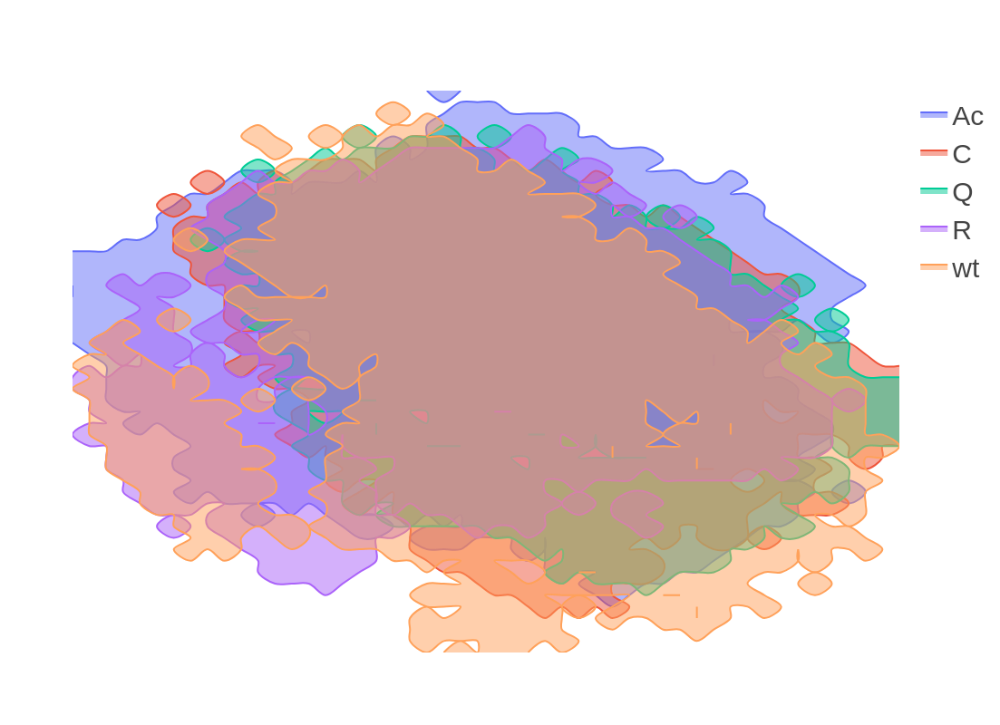

In [22]:
fig = em.plot.plot_trajs_by_parameter(
    Ub_K11_trajs,
    parameter="common_str",
    type="heatmap",
    show=False,
    nbins=50,
    alpha=0.5,
    contourtype="contourf",
)
fig.update_layout(
    {
        "width": 800,
        "height": 800,
        "template": "none",
        "xaxis": {
            "showgrid": False,
            "showline": False,
            "zeroline": False,
            "showticklabels": False,
            "ticks": "",
        },
        "yaxis": {
            "showgrid": False,
            "showline": False,
            "zeroline": False,
            "showticklabels": False,
            "ticks": "",
        },
        "plot_bgcolor": "rgba(0, 0, 0, 0)",
        "paper_bgcolor": 'rgba(0, 0, 0, 0)',
        "title": None,
        "legend": {
            "font": {
                "size": 30,
            },
        },
    }
)
# fig.write_image(figure_5_trained_nn_dir / "lowd.svg", scale=2)
# fig.write_image(figure_5_trained_nn_dir / "lowd.png", scale=2)
fig.show()

And using free energy as coloration.

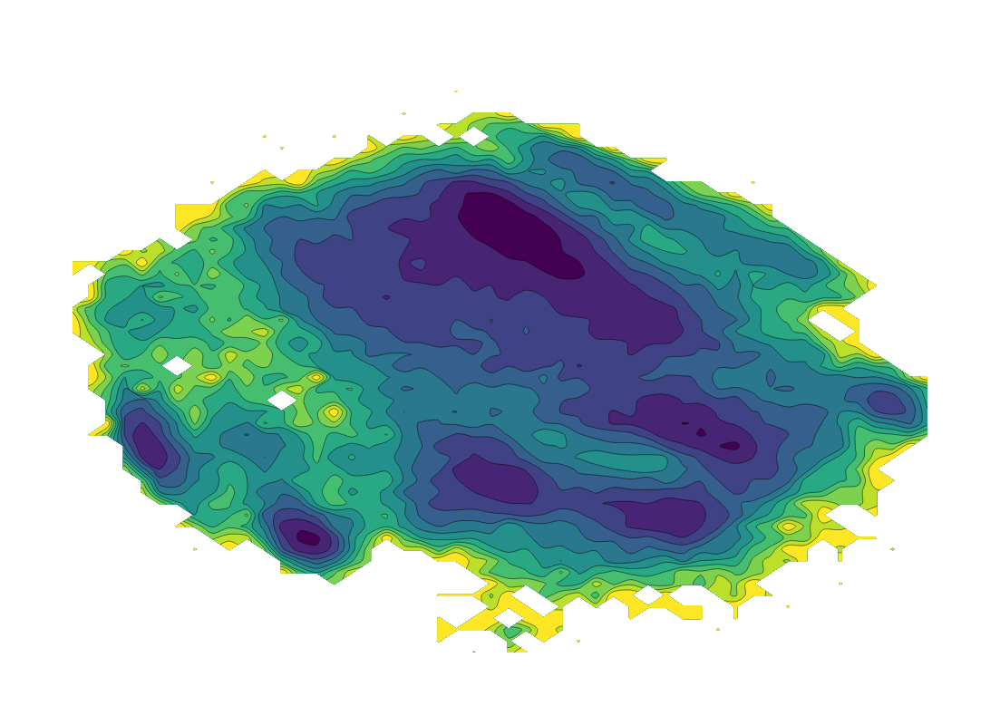

In [23]:
from encodermap.plot.plotting import _plot_free_energy

# for the one bundled as project
# basin_indices = [0, 26, 51, 72, 98]
basin_indices = [0, 21, 32, 48, 62, 99]

fig = go.Figure(
    data=[
        _plot_free_energy(*Ub_K11_trajs.lowd.T, bins=50),
    ]
)
layout = {
    "width": 800,
    "height": 800,
    "template": "none",
    "title": None,
    "xaxis": {
        "showgrid": False,
        "showline": False,
        "zeroline": False,
        "title": None,
        "showticklabels": False,
        "ticks": "",
    },
    "yaxis": {
        "showgrid": False,
        "showline": False,
        "zeroline": False,
        "title": None,
        "showticklabels": False,
        "ticks": "",
    },
    "plot_bgcolor": "rgba(0, 0, 0, 0)",
    "paper_bgcolor": 'rgba(0, 0, 0, 0)',
}
fig.update_layout(**layout)
fig.show()

### Cluster and paths

Clusters and paths can be generated using EncoderMap's `InteractivePlotting`. Note, that clusters are extracted from simulated MD conformations, by RMSD-aligning a subset of the selected points. In contrary, paths represent arbitrary points on the low-dimensional projection of the latent space. EncoderMap's decoder network can generate molecular conformations from these points.

In [24]:
sess = em.InteractivePlotting(
    trajs=Ub_K11_trajs,
    autoencoder=Ub_K11_emap,
)

GridspecLayout(children=(HTML(value='<h2>EncoderMap Dashboard for kevin in /h/k/g/e/d/s/n/p/trained_networks/f…

#### Cluster

A cluster has been selected using EncoderMap's `InteractivePlotting`. The selected points are also available upon reasonable request.

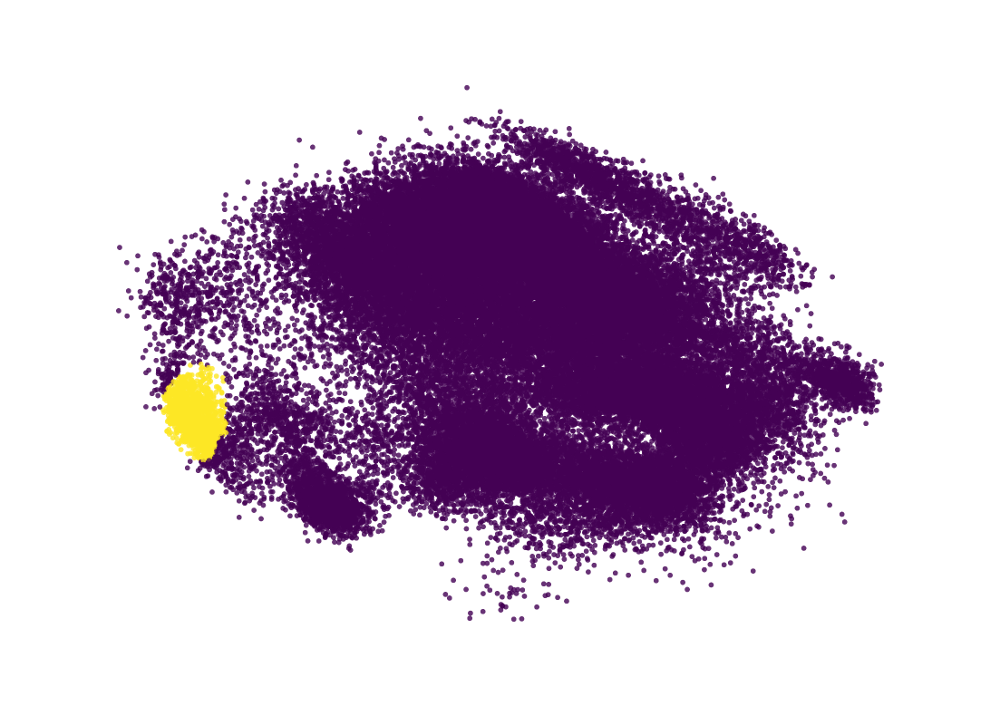

In [25]:
# np.save(figure_5_trained_nn_dir / "cluster_assignment/membership.npy", Ub_K11_trajs._user_selected_points)
Ub_K11_trajs.load_CVs(
    np.load(figure_5_trained_nn_dir / "clusters/membership.npy"),
    attr_name="cluster_membership",
)
with set_env(ENCODERMAP_SKIP_SCATTER_SIZE_CHECK="True"):
    fig = em.plot.plot_trajs_by_parameter(Ub_K11_trajs, "cluster_membership", cbar=False, show=False)
fig.update_layout(**layout)
# fig.write_image(figure_5_trained_nn_dir / "cluster_selection.svg", scale=2)
# fig.write_image(figure_5_trained_nn_dir / "cluster_selection.png", scale=2)
fig.show()

Next, the cluster can be saved to pdb and then rendered using external tools.

In [26]:
cluster = Ub_K11_trajs.cluster(0, n_points=10)
for i, (cs, traj) in enumerate(cluster.join(dict_keys="cs").items()):
    traj.save_pdb(str(figure_5_trained_nn_dir / f"clusters/trajs_in_cluster_with_{cs}_topology.pdb"))

Joining...:   0%|          | 0/3 [00:00<?, ?it/s]

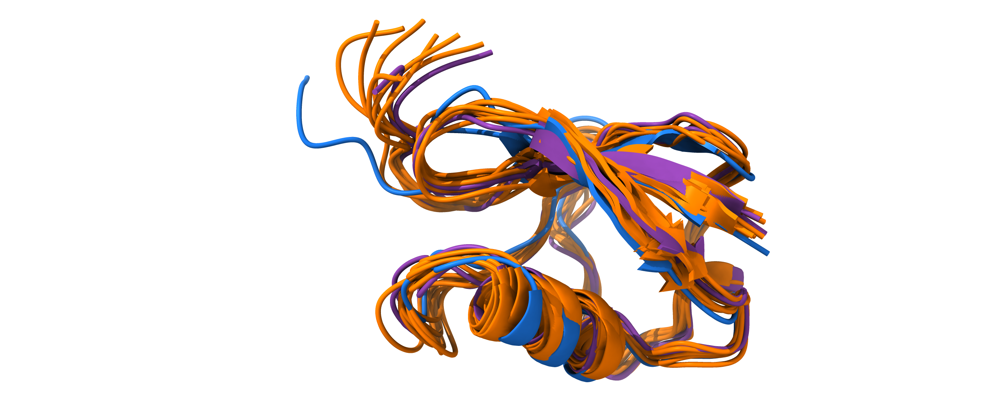

In [27]:
from IPython.display import Image, display
display(Image(figure_5_trained_nn_dir / "clusters/chimeraX_render.png", width=600))

#### Path

The selected Path is provided in the accompanzing dataset.

In [28]:
# np.save(figure_5_trained_nn_dir / "paths/path.npy", sess.path)
path = np.load(figure_5_trained_nn_dir / "paths/path.npy")

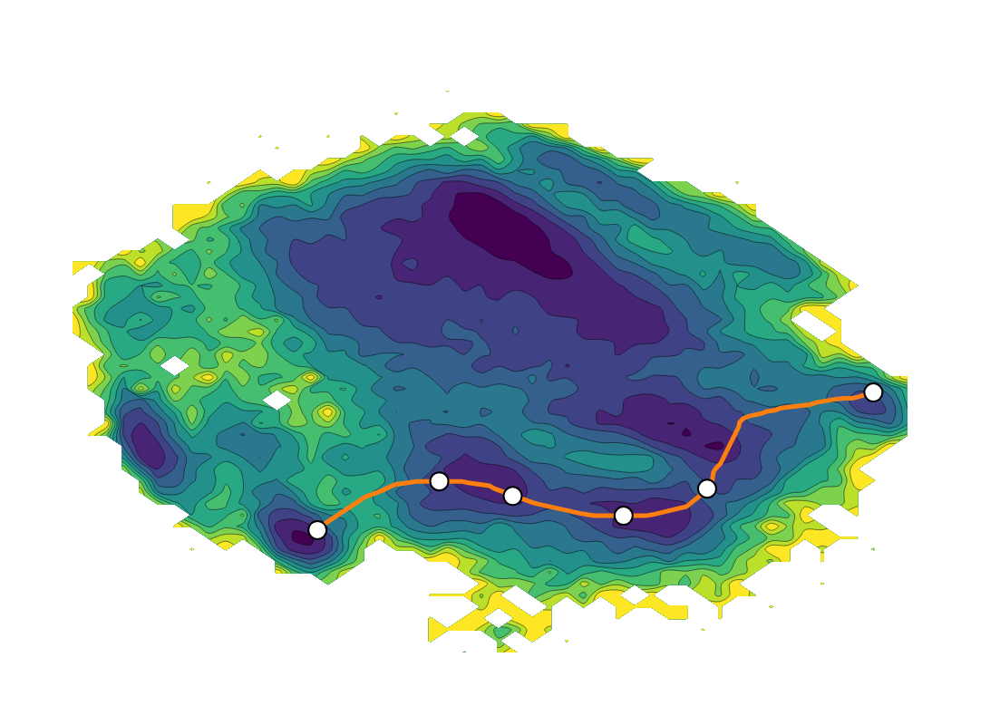

In [29]:
from encodermap.plot.plotting import _plot_free_energy

# for the one bundled as project
basin_indices = [0, 21, 32, 48, 62, 99]

fig = go.Figure(
    data=[
        _plot_free_energy(*Ub_K11_trajs.lowd.T, bins=50),
        go.Scatter(
            x=path[:, 0],
            y=path[:, 1],
            mode="lines",
            name="",
            line_width=5,
            customdata=[i for i in range(len(path))],
            hovertemplate="%{customdata}",
            showlegend=False,
        ),
        go.Scatter(
            x=path[basin_indices, 0],
            y=path[basin_indices, 1],
            mode="markers",
            name="",
            line_width=0,
            showlegend=False,
            marker={
                "size": 20,
                "line": {
                    "color": "black",
                    "width": 2,
                },
                "color": "white",
            },
        )
    ]
)
layout = {
    "width": 800,
    "height": 800,
    "template": "none",
    "xaxis": {
        "showgrid": False,
        "showline": False,
        "zeroline": False,
        "showticklabels": False,
        "ticks": "",
    },
    "yaxis": {
        "showgrid": False,
        "showline": False,
        "zeroline": False,
        "showticklabels": False,
        "ticks": "",
    },
    "plot_bgcolor": "rgba(0, 0, 0, 0)",
    "paper_bgcolor": 'rgba(0, 0, 0, 0)',
}
fig.update_layout(**layout)
# fig.write_image(figure_5_trained_nn_dir / "path.svg", scale=2)
# fig.write_image(figure_5_trained_nn_dir / "path.png", scale=2)
fig.show()

Generate wt conformations along the path.

In [30]:
wt_traj = Ub_K11_emap.generate(path, top="wt")

/home/kevin/git/encoder_map_private/encodermap/trajinfo/trajinfo_utils.py:1299: UserWarning:

Your custom topology for residue name=KAC resSeq=None index=None does not define atoms for the dihedral PSI. If this dihedral consists of standard atom names, it will be considered for dihedral calculations. If this dihedral should not be present in your custom topology you need to explicitly delete it by adding 'PSI_ATOMS': 'delete' to your custom_topology. If you want this dihedral to be present in your topology, you can ignore this warning.

/home/kevin/git/encoder_map_private/encodermap/trajinfo/trajinfo_utils.py:1299: UserWarning:

Your custom topology for residue name=KAC resSeq=None index=None does not define atoms for the dihedral OMEGA. If this dihedral consists of standard atom names, it will be considered for dihedral calculations. If this dihedral should not be present in your custom topology you need to explicitly delete it by adding 'OMEGA_ATOMS': 'delete' to your custom_topology

Backmapping...:   0%|          | 0/37700 [00:00<?, ?it/s]

In [31]:
import ipywidgets as widgets
import nglview as nv

grid = widgets.GridspecLayout(
    n_columns=len(basin_indices),
    n_rows=1,
    justify_content="center",
    align_items="center",
    height="200px"
)

views = []
for i, b in enumerate(basin_indices):
    view = nv.show_mdtraj(wt_traj[b], height="200px", width="200px")
    view.clear_representations()
    view.add_ribbon(color_scheme="sstruc")
    view.add_ball_and_stick(selection="11 and (.CA or .CB. or .CG or .CD or .CE or .NZ)", color="blue")
    views.append(view)
    grid[0, i] = view

grid

GridspecLayout(children=(NGLWidget(layout=Layout(grid_area='widget001')), NGLWidget(layout=Layout(grid_area='w…

Generate different conformations

In [32]:
# C
traj_c = Ub_K11_emap.generate(np.expand_dims(path[32], 0), top="C")
print(traj_c.n_atoms)

# wt
traj_wt = Ub_K11_emap.generate(np.expand_dims(path[32], 0), top="wt")
print(traj_wt.n_atoms)

# KAc
traj_KAc = Ub_K11_emap.generate(np.expand_dims(path[32], 0), top="Ac")
print(traj_KAc.n_atoms)

Backmapping...:   0%|          | 0/374 [00:00<?, ?it/s]

757


Backmapping...:   0%|          | 0/377 [00:00<?, ?it/s]

762


/home/kevin/git/encoder_map_private/encodermap/trajinfo/trajinfo_utils.py:1299: UserWarning:

Your custom topology for residue name=KAC resSeq=None index=None does not define atoms for the dihedral PSI. If this dihedral consists of standard atom names, it will be considered for dihedral calculations. If this dihedral should not be present in your custom topology you need to explicitly delete it by adding 'PSI_ATOMS': 'delete' to your custom_topology. If you want this dihedral to be present in your topology, you can ignore this warning.

/home/kevin/git/encoder_map_private/encodermap/trajinfo/trajinfo_utils.py:1299: UserWarning:

Your custom topology for residue name=KAC resSeq=None index=None does not define atoms for the dihedral OMEGA. If this dihedral consists of standard atom names, it will be considered for dihedral calculations. If this dihedral should not be present in your custom topology you need to explicitly delete it by adding 'OMEGA_ATOMS': 'delete' to your custom_topology

Backmapping...:   0%|          | 0/378 [00:00<?, ?it/s]

763


In [33]:
import ipywidgets as widgets
import nglview as nv

grid = widgets.GridspecLayout(
    n_columns=3,
    n_rows=1,
    justify_content="center",
    align_items="center",
    height="200px"
)

views = []
for i, b in enumerate([traj_c, traj_wt, traj_KAc]):
    view = nv.show_mdtraj(b, height="200px", width="200px")
    view.clear_representations()
    view.add_ribbon(color_scheme="sstruc")
    view.add_ball_and_stick(selection="11 and (.CA or .CB. or .CG or .CD or .CE or .NZ)", color="blue")
    views.append(view)
    grid[0, i] = view

grid

GridspecLayout(children=(NGLWidget(layout=Layout(grid_area='widget001')), NGLWidget(layout=Layout(grid_area='w…